In [1]:
import numpy as np
import jax.numpy as jnp
import matplotlib.pyplot as plt
import pandas as pd
from jax import config, random
import numpyro, jax
import numpyro.distributions as dist
from numpyro.infer import MCMC, NUTS, init_to_value
config.update('jax_enable_x64', True)
numpyro.set_platform('cpu')
num_chains = 4
numpyro.set_host_device_count(num_chains)
print ('# jax device count:', jax.local_device_count())

# jax device count: 4


In [2]:
import importlib_resources
from jnkepler.jaxttv.infer import *
from jnkepler.nbodytransit import *
path = importlib_resources.files('jnkepler').joinpath('data')

In [3]:
import seaborn as sns
sns.set(style='ticks', font_scale=1.6, font='times')
plt.rcParams["figure.figsize"] = (12,6)
from matplotlib import rc

### load test data

In [4]:
# transit times
d = pd.read_csv("kep51_ttv_photodtest.txt", sep="\s+", header=None, names=['tnum', 'tc', 'tcerr', 'dnum', 'planum'])


<>:2: SyntaxWarning: invalid escape sequence '\s'
<>:2: SyntaxWarning: invalid escape sequence '\s'
/var/folders/69/wlx91x8s1x34mphlfjy0h4pm0000gn/T/ipykernel_38320/537980166.py:2: SyntaxWarning: invalid escape sequence '\s'
  d = pd.read_csv("kep51_ttv_photodtest.txt", sep="\s+", header=None, names=['tnum', 'tc', 'tcerr', 'dnum', 'planum'])


In [5]:
tcobs = [jnp.array(d.tc[d.planum==j+1]) for j in range(3)]
errorobs = [jnp.array(d.tcerr[d.planum==j+1]) for j in range(3)]
p_init = [45.155305, 85.31646, 130.17809]
dt = 1.0
t_start, t_end = 155., 1500.


In [7]:
# detrended light curves around transits; here simultaneous transit is excluded
dlc = pd.read_csv("kep51_lc_photodtest.csv")
time_obs = jnp.array(dlc['time'])
flux_obs = jnp.array(dlc['flux']) - 1.
error_obs = jnp.array(dlc['flux_err']) 

print(dlc)


             time      flux  flux_err  tranum  plnum
0      158.750626  0.999814  0.000288       0      1
1      158.771057  0.999394  0.000288       0      1
2      158.791489  1.000743  0.000288       0      1
3      158.811920  0.999971  0.000288       0      1
4      158.832367  1.000260  0.000288       0      1
...           ...       ...       ...     ...    ...
1684  1575.144043  1.000120  0.000296      16      2
1685  1575.164429  1.000132  0.000296      16      2
1686  1575.184937  1.000340  0.000296      16      2
1687  1575.205322  0.999883  0.000296      16      2
1688  1575.225830  0.999719  0.000296      16      2

[1689 rows x 5 columns]


### initialize

In [8]:
nt = NbodyTransit(t_start, t_end, dt, tcobs, p_init, errorobs=errorobs, print_info=True)
nt.set_lcobs(time_obs)

# number of transiting planets:    3
# integration starts at:           155.00
# first transit time in data:      159.11
# last transit time in data:       1489.75
# integration ends at:             1500.00
# integration time step:           1.0000 (1/45 of innermost period)

# exposure time (min):             29.4
# supersampling factor:            10


/opt/homebrew/anaconda3/envs/tess-old/lib/python3.12/site-packages/jnkepler/nbodytransit/nbodytransit.py:72: UserWarning: set overlapping_transit to True if overlapping transits are present in the data.
  warnings.warn(


### TTV only optimization

In [9]:
param_bounds_ttv = ttv_default_parameter_bounds(nt)

/opt/homebrew/anaconda3/envs/tess-old/lib/python3.12/site-packages/jnkepler/jaxttv/infer.py:97: UserWarning: Bounds for cosi/lnode not provided: assuming coplanar orbits.
  warnings.warn(


# running least squares optimization...
# objective function: 23170.92 --> 38.32 (49 data)
# elapsed time: 1.4 sec


/opt/homebrew/anaconda3/envs/tess-old/lib/python3.12/site-packages/jnkepler/jaxttv/jaxttv.py:523: UserWarning: using t0 and P from a linear fit to the observed transit times.
  warnings.warn(


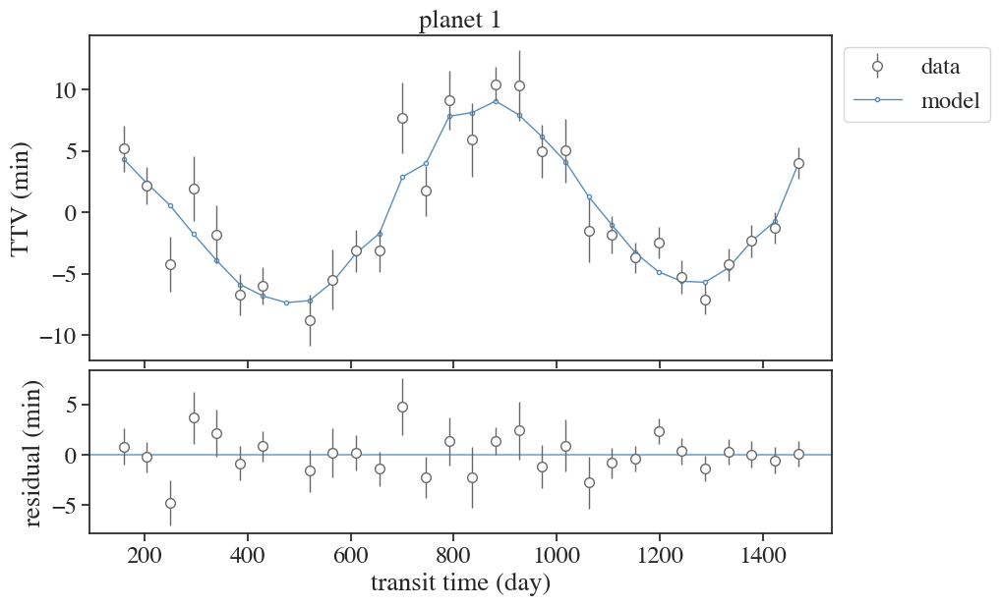

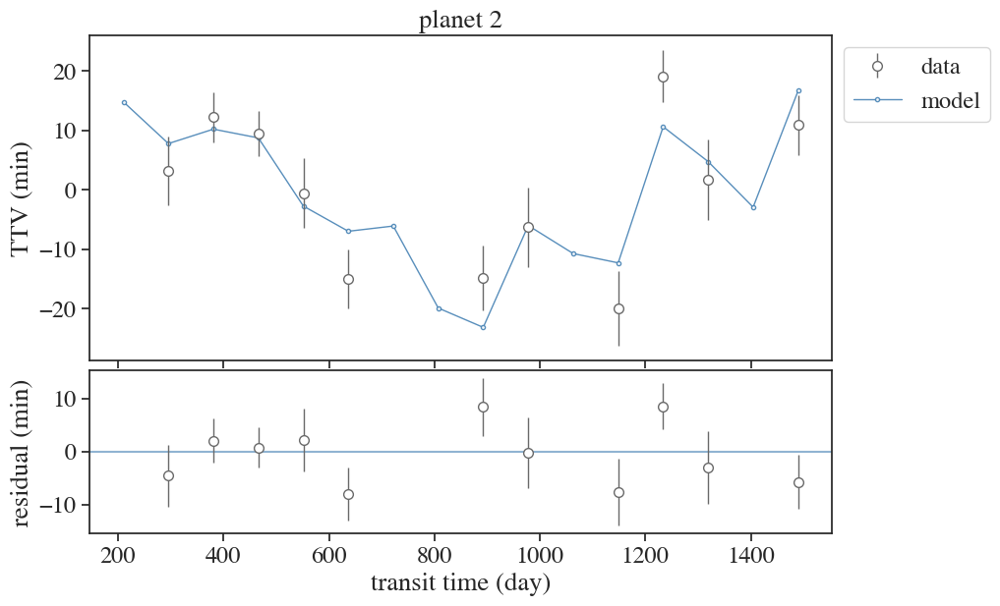

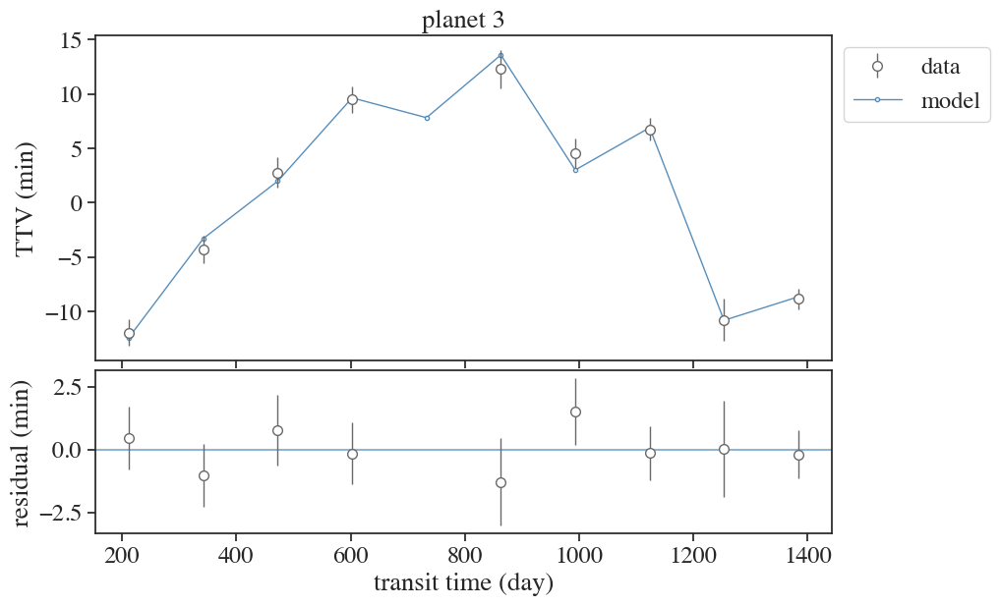

In [10]:
popt = ttv_optim_curve_fit(nt, param_bounds_ttv)

# fractional energy error (symplectic, dt=1.00e+00): 1.70e-09
# fractional energy error (symplectic, dt=4.52e-02): 3.74e-12
# max difference in tc: 2.73e-06 days (0.24 sec)


sample: 100%|█| 1000/1000 [00:00<00:00, 2175.78it/s, 3 steps of size 5.91e-01. a



                mean       std    median      5.0%     95.0%     n_eff     r_hat
      lndf      3.24      0.94      3.35      1.84      4.59    102.41      1.01
     lnvar     -0.35      0.23     -0.36     -0.72      0.02    168.13      1.00

Number of divergences: 0


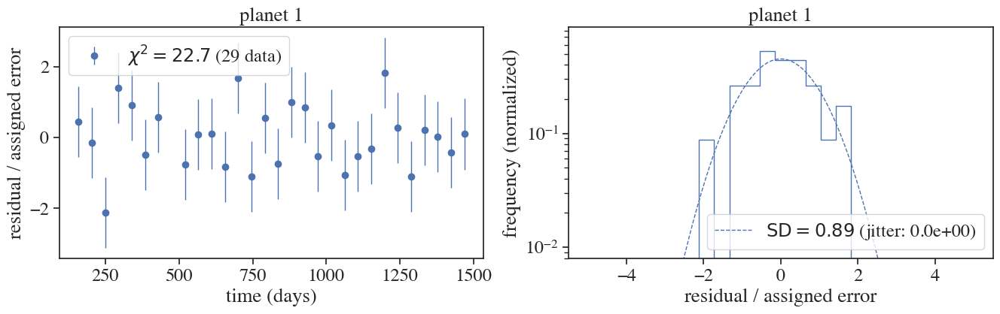

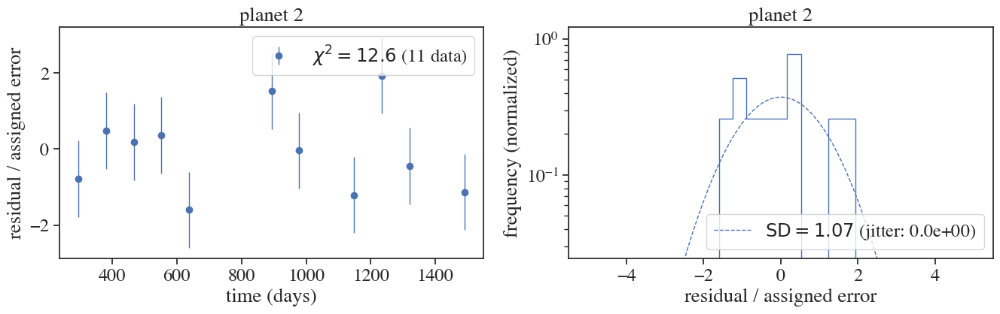

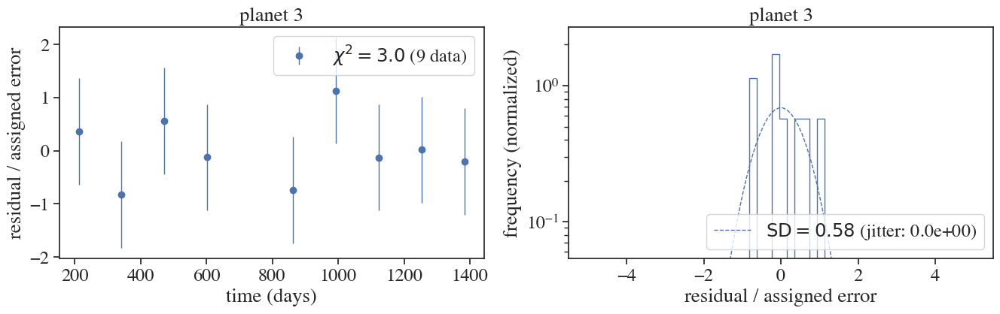

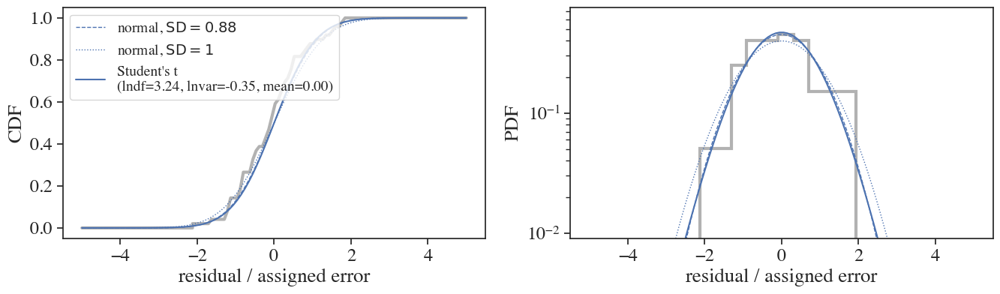

In [11]:
tc, _ = nt.check_timing_precision(popt)

pdic_normal, pdic_student = nt.check_residuals(popt)#, jitters=jitters)
plt.show()

### transit parameter optimization

In [12]:
from jnkepler.infer import optim_svi

In [13]:
popt["smass"] = 1.

In [14]:
keys_ttv = ["ecosw", "esinw", "pmass", "period", "tic"]
keys_transit = ["radius_ratio", "b", "srad", "q1", "q2", "meanflux"]
param_bounds_transit = {
    "q1": [jnp.array(0), jnp.array(1.)],
    "q2": [jnp.array(0), jnp.array(1.)],
    "radius_ratio":  [jnp.zeros(3), jnp.ones(3)*0.1],
    "b": [jnp.zeros(3), jnp.ones(3)*1.1],
    "srad": [jnp.array(0.5), jnp.array(1.5)],
    "meanflux": [jnp.array(-1e-4), jnp.array(1e-4)]
}

In [15]:
import celerite2
from celerite2.jax import terms as jax_terms

def model_fix_ttv(par_dict, param_bounds_transit):
    par = {}

    for key in keys_ttv + ["smass"]:
        par[key] = par_dict[key]

    for key in keys_transit:
        if key in ["q1", "q2", "b"]:
            par[key] = numpyro.sample(key, dist.Uniform(param_bounds_transit[key][0], param_bounds_transit[key][1]))
        else:
            par[key+"_scaled"] = numpyro.sample(key+"_scaled", dist.Uniform(param_bounds_transit[key][0]*0, param_bounds_transit[key][0]*0+1.))
            par[key] = numpyro.deterministic(key, par[key+"_scaled"] * (param_bounds_transit[key][1] - param_bounds_transit[key][0]) + param_bounds_transit[key][0])

    
    fluxmodel, tcmodel = nt.get_flux(par)
    numpyro.deterministic("tcmodel", tcmodel)
    fluxmodel = numpyro.deterministic("fluxmodel", fluxmodel)    
    residual = numpyro.deterministic("residual", flux_obs - fluxmodel - par["meanflux"])
    numpyro.deterministic("normed_residual", residual / error_obs)
    
    # GP likelihood
    lna = numpyro.sample("lna", dist.Uniform(low=-14, high=-4))
    lnc = numpyro.sample("lnc", dist.Uniform(low=-5, high=1))
    lnjitter = numpyro.sample("lnjitter", dist.Uniform(low=-14, high=-4))
    jitter = numpyro.deterministic("jitter", jnp.exp(lnjitter))
    kernel = jax_terms.Matern32Term(sigma=jnp.exp(lna), rho=jnp.exp(lnc))
    gp = celerite2.jax.GaussianProcess(kernel, mean=0.0)
    gp.compute(nt.times_lc, diag=error_obs**2 + jitter**2)
    numpyro.sample("obs", gp.numpyro_dist(), obs=residual)
    numpyro.deterministic("gppred", gp.predict(residual))

In [16]:
popt_transit = optim_svi(model_fix_ttv, 1e-2, 5000, par_dict=popt, param_bounds_transit=param_bounds_transit)

/opt/homebrew/anaconda3/envs/tess-old/lib/python3.12/site-packages/jaxtyping/__init__.py:231: UserWarning: jaxtyping version >=0.2.23 should be used with Equinox version >=0.11.1
  warnings.warn(
100%|█| 5000/5000 [05:03<00:00, 16.49it/s, init loss: 30576.4373, avg. loss [475


In [17]:
from scipy.stats import norm 
def check_residuals(p):
    bins = np.linspace(-7, 7, 100)
    plt.yscale("log")
    plt.xlabel("normalized residual from GP mean")
    res = (p['residual'] - p["gppred"]) / error_obs
    plt.hist(res, bins=bins, density=True, alpha=0.6, label="SD=%.2f"%np.std(res))
    plt.ylim(plt.gca().get_ylim())
    plt.plot(bins, norm.pdf(bins), color='gray', label='standard normal')
    plt.legend(loc='best')
    plt.ylabel("PDF");

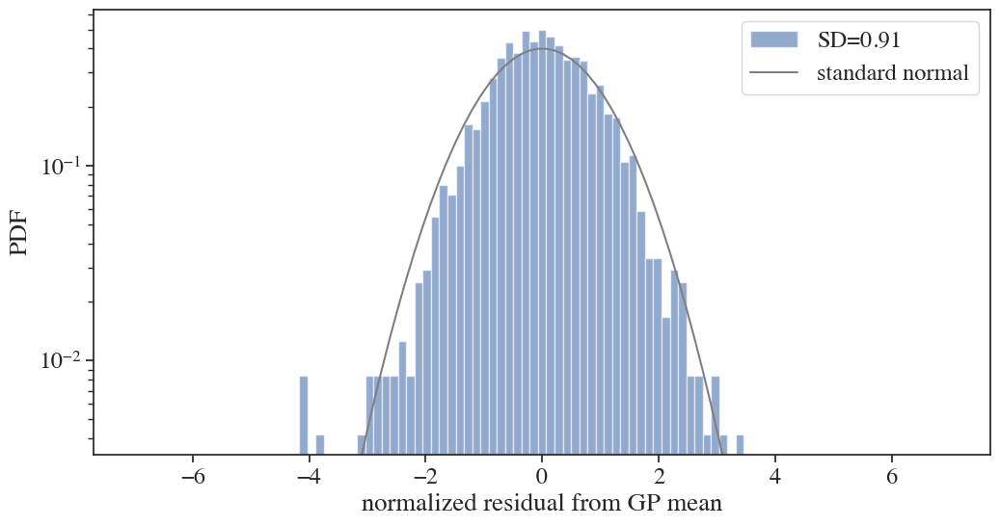

In [18]:
check_residuals(popt_transit)

### optimizing full photodynamics model

In [19]:
popt_ttv_scaled = scale_pdic(popt, param_bounds_ttv)
popt_full = popt_transit.copy()
popt_full.update(popt_ttv_scaled)

In [20]:
popt_full['lnode_innder'] = jnp.zeros(2)

In [21]:
def model_full(param_bounds_ttv, param_bounds_transit):
    """full photodynamical model
    
        - noise model is iid gaussian; we could've used other noise model (e.g., GP, Student's t)
        - we could've fitted mean flux as well
        - stellar mass is fixed to 1Msun and only radius is floated, because only mean stellar density is constrained from this model;
          so pmass is mass ratio and stellar radius (srad) is in units of Rsun/(Mstar/Msun)**(1./3.)
        - impact parameters are restricted to be positive but this could be relaxed
        - longitude of ascending node (lnode) is measured with respect to the outermost transiting planet

    """
    # fix stellar mass to 1Msun without losing generality
    par = {"smass": 1.}

    # TTV parameters
    for key in keys_ttv:
        par[key+"_scaled"] = numpyro.sample(key+"_scaled", dist.Uniform(param_bounds_ttv[key][0]*0, param_bounds_ttv[key][0]*0+1.))
        par[key] = numpyro.deterministic(key, par[key+"_scaled"] * (param_bounds_ttv[key][1] - param_bounds_ttv[key][0]) + param_bounds_ttv[key][0])

    # add longitude of ascending node; prior Unif(-1, 1)
    lnode_inner = numpyro.sample("lnode_inner", dist.Uniform(-jnp.ones(2), jnp.ones(2)))
    par["lnode"] = numpyro.deterministic("lnode", jnp.hstack([lnode_inner, 0.]))

    # Jacobian for uniform ecc prior
    ecc = numpyro.deterministic("ecc", jnp.sqrt(par['ecosw']**2+par['esinw']**2))
    numpyro.factor("eprior", -jnp.log(ecc))

    # transit parameters (though note that b is used to fix inclination along with other TTV parameters)
    for key in keys_transit:
        if key in ["q1", "q2", "b"]:
            par[key] = numpyro.sample(key, dist.Uniform(param_bounds_transit[key][0], param_bounds_transit[key][1]))
        else:
            par[key+"_scaled"] = numpyro.sample(key+"_scaled", dist.Uniform(param_bounds_transit[key][0]*0, param_bounds_transit[key][0]*0+1.))
            par[key] = numpyro.deterministic(key, par[key+"_scaled"] * (param_bounds_transit[key][1] - param_bounds_transit[key][0]) + param_bounds_transit[key][0])
    
    # compute model (tcmodel is not used)
    fluxmodel, tcmodel = nt.get_flux(par)
    numpyro.deterministic("tcmodel", tcmodel)
    numpyro.deterministic("fluxmodel", fluxmodel)  

    # GP likelihood  
    residual = numpyro.deterministic("residual", flux_obs - fluxmodel - par["meanflux"])
    numpyro.deterministic("normed_residual", residual / error_obs)
    lna = numpyro.sample("lna", dist.Uniform(low=-14, high=-4))
    lnc = numpyro.sample("lnc", dist.Uniform(low=-5, high=1))
    lnjitter = numpyro.sample("lnjitter", dist.Uniform(low=-14, high=-4))
    jitter = numpyro.deterministic("jitter", jnp.exp(lnjitter))
    kernel = jax_terms.Matern32Term(sigma=jnp.exp(lna), rho=jnp.exp(lnc))
    gp = celerite2.jax.GaussianProcess(kernel, mean=0.0)
    gp.compute(nt.times_lc, diag=error_obs**2 + jitter**2)
    numpyro.sample("obs", gp.numpyro_dist(), obs=residual)
    numpyro.deterministic("gppred", gp.predict(residual))

In [22]:
popt_full = optim_svi(model_full, 1e-2, 5000, p_initial=popt_full, param_bounds_ttv=param_bounds_ttv, param_bounds_transit=param_bounds_transit)

100%|█| 5000/5000 [05:00<00:00, 16.63it/s, init loss: 6941.9157, avg. loss [4751


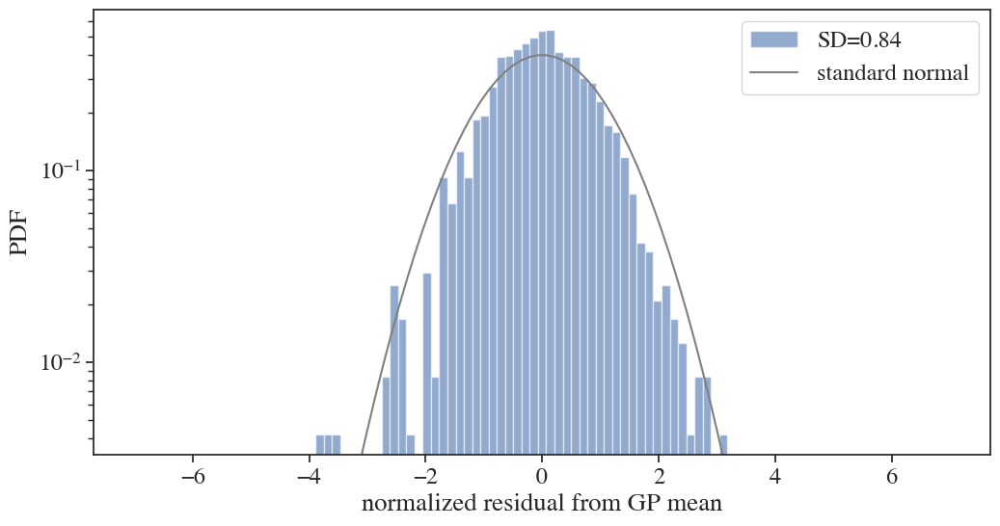

In [23]:
check_residuals(popt_full)

### running HMC

In [21]:
from numpyro.infer import MCMC, NUTS
kernel = NUTS(model_full, dense_mass=True, init_strategy=init_to_value(values=popt_full), max_tree_depth=11)

In [22]:
mcmc = MCMC(kernel, num_warmup=500, num_samples=1500, num_chains=num_chains)

In [23]:
from jax import random
rng_key = random.PRNGKey(0)
mcmc.run(rng_key, param_bounds_ttv, param_bounds_transit, extra_fields=('potential_energy', 'num_steps', 'adapt_state'))

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

In [26]:
mcmc.print_summary()


                            mean       std    median      5.0%     95.0%     n_eff     r_hat
                  b[0]      0.24      0.06      0.24      0.15      0.34    736.86      1.01
                  b[1]      0.99      0.02      0.98      0.96      1.01   1538.85      1.00
                  b[2]      0.10      0.07      0.09      0.00      0.21    490.75      1.01
       ecosw_scaled[0]      0.44      0.02      0.45      0.41      0.48   3473.11      1.00
       ecosw_scaled[1]      0.52      0.03      0.52      0.48      0.57   2186.11      1.00
       ecosw_scaled[2]      0.52      0.02      0.51      0.48      0.55   2235.24      1.00
       esinw_scaled[0]      0.44      0.04      0.45      0.39      0.50   1322.22      1.00
       esinw_scaled[1]      0.49      0.05      0.51      0.40      0.55    933.66      1.00
       esinw_scaled[2]      0.49      0.04      0.51      0.42      0.54    938.73      1.00
                   lna     -8.62      0.06     -8.62     -8.72     -8

In [25]:
# save output
import dill
with open("kep51_photodynamics_gp_c4_mcmc.pkl", "wb") as f:
    dill.dump(mcmc, f)

### trace and corner plots

In [27]:
import arviz as az
idata = az.from_numpyro(mcmc)

In [28]:
az.rcParams['plot.max_subplots'] = 100

In [29]:
keys_gp = ['lna', 'lnc', 'lnjitter']

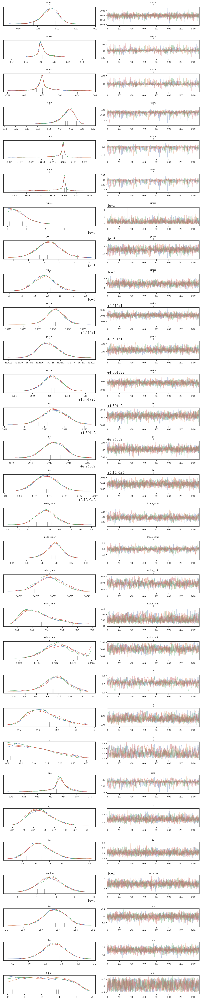

In [31]:
fig = az.plot_trace(mcmc, var_names=keys_ttv+['lnode_inner']+keys_transit+keys_gp, compact=False)
plt.tight_layout(pad=0.2)

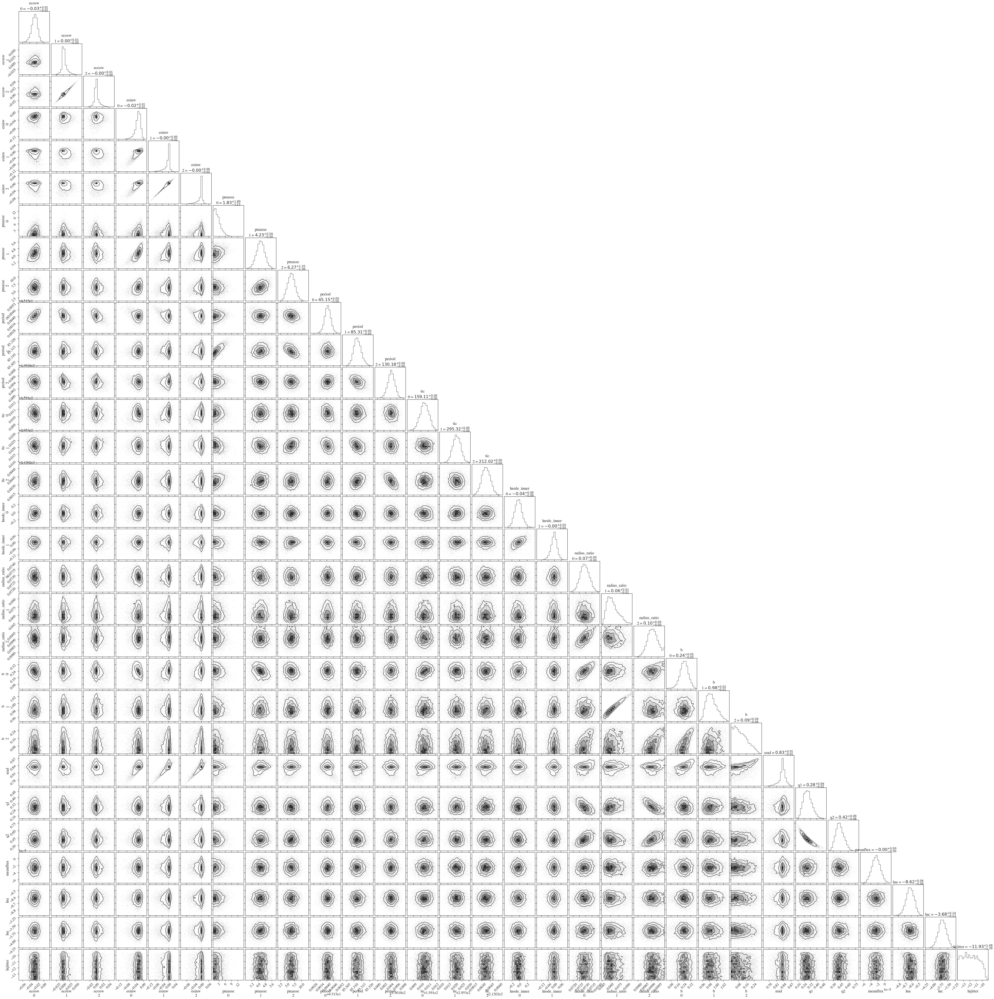

In [32]:
import corner
idata.posterior['pmasse'] = idata.posterior['pmass'] / 3.003e-6
keys_ttv_ = [key if key!="pmass" else "pmasse" for key in keys_ttv]
fig = corner.corner(idata, var_names=keys_ttv_+['lnode_inner']+keys_transit+keys_gp, show_titles=True)

In [42]:
samples = mcmc.get_samples()
fmodels = samples['fluxmodel'] + samples['meanflux'][:,None] + samples['gppred']
mu_phys = np.mean(samples['fluxmodel'] + samples['meanflux'][:,None], axis=0)
mu, sigma = np.mean(fmodels, axis=0), np.std(fmodels, axis=0)

/var/folders/p_/tn019k611w94gmm9mshr0g1c0000gn/T/ipykernel_4724/1478377552.py:5: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure()


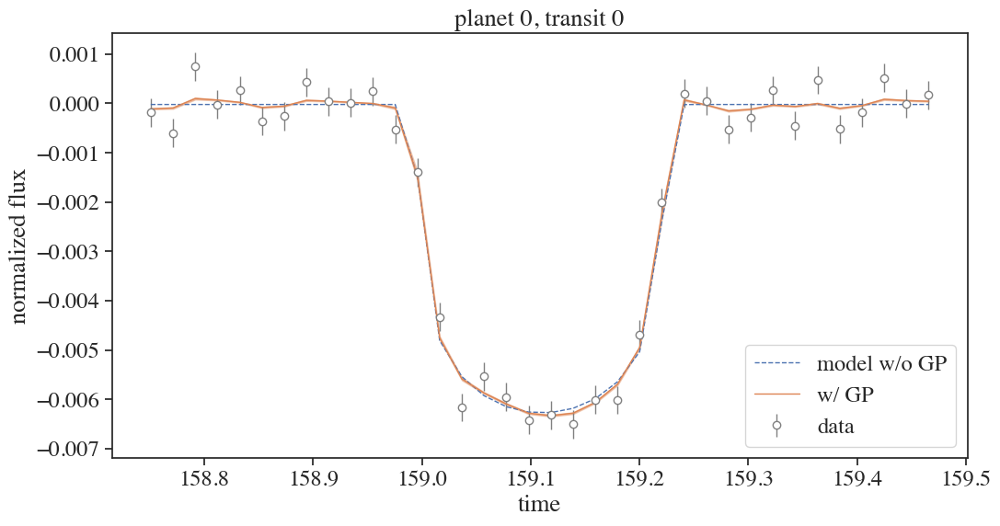

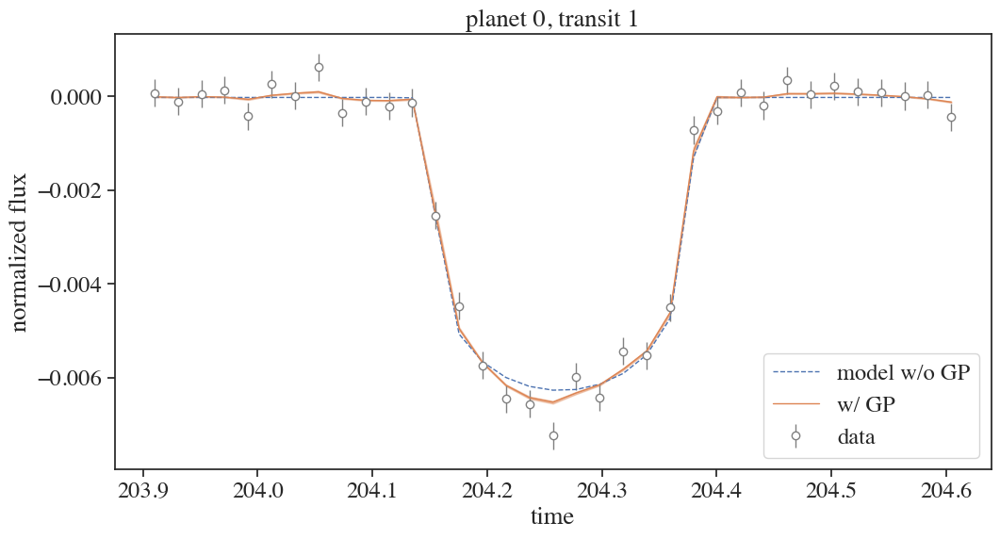

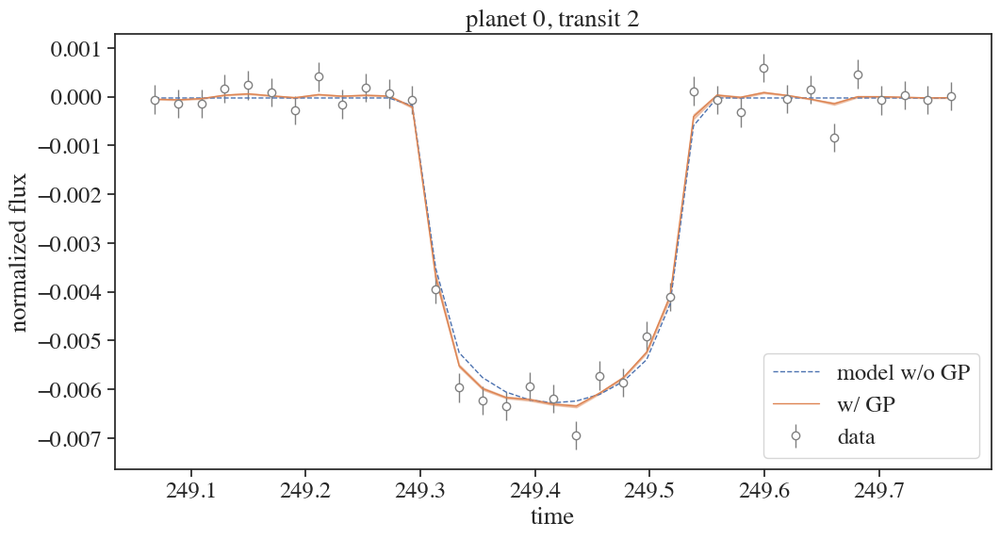

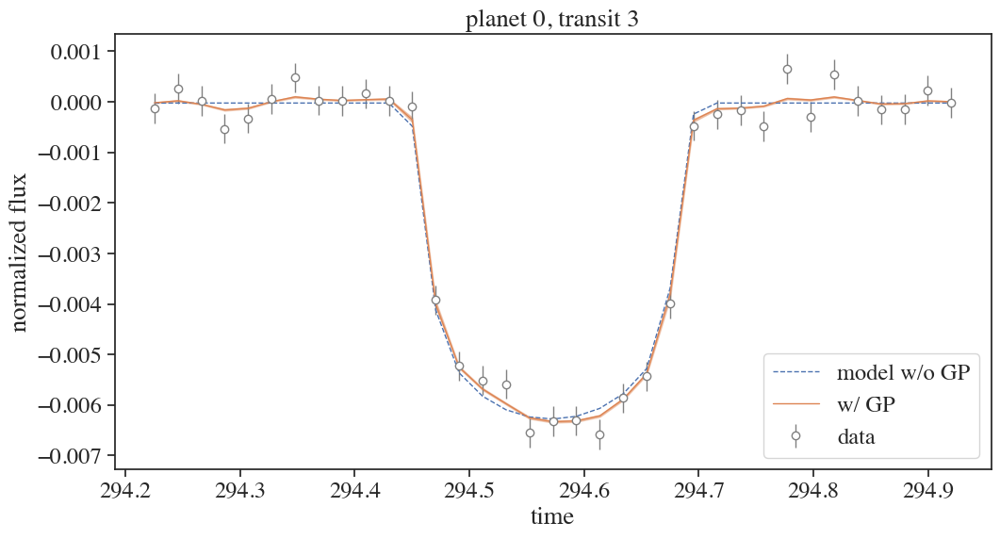

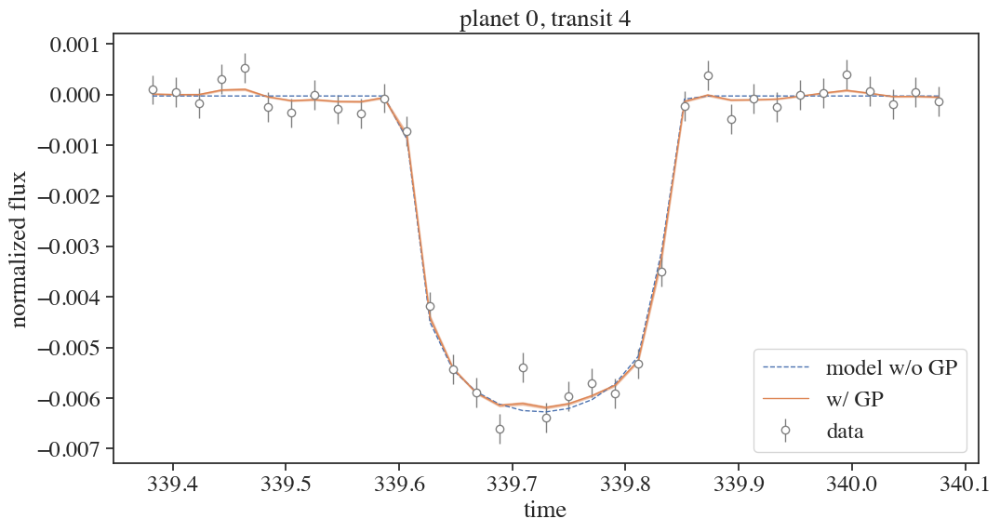

...

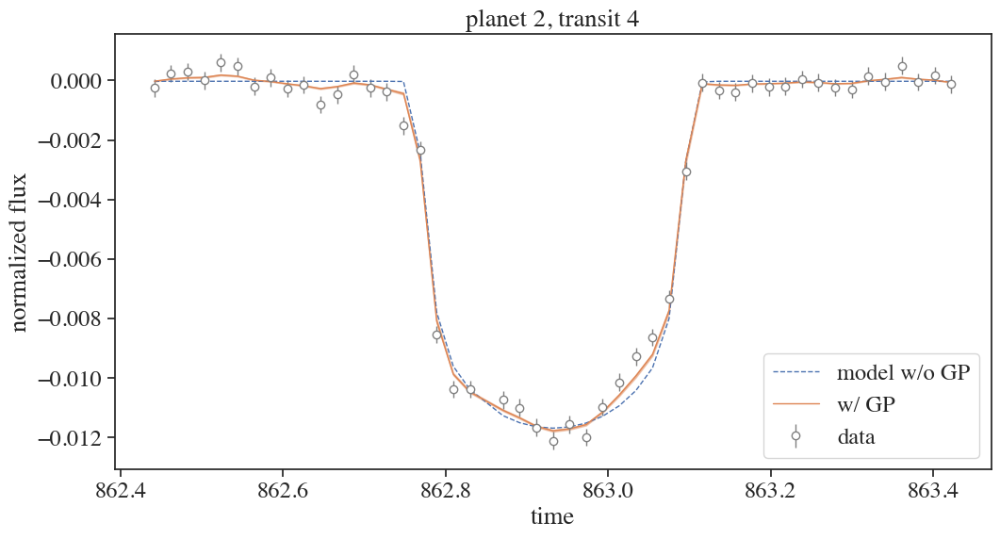

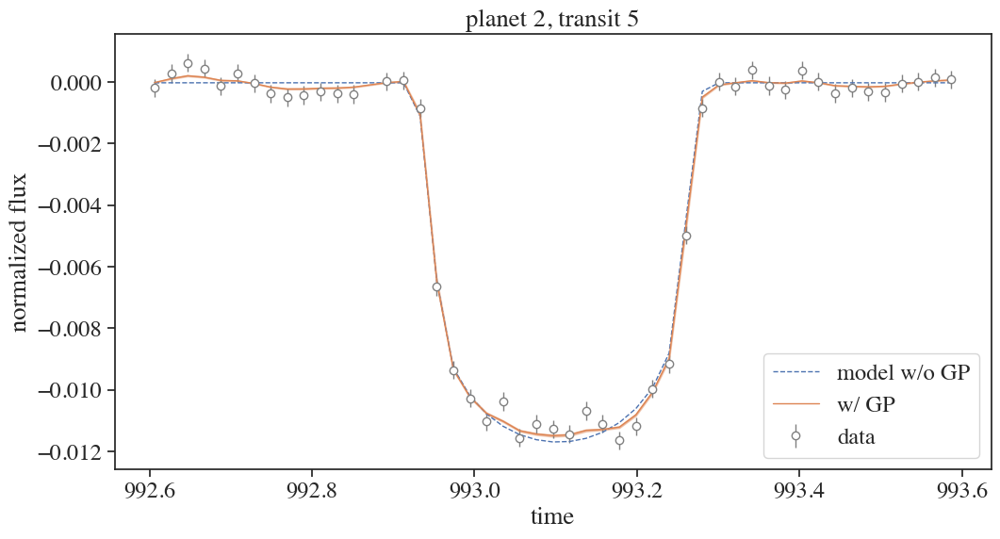

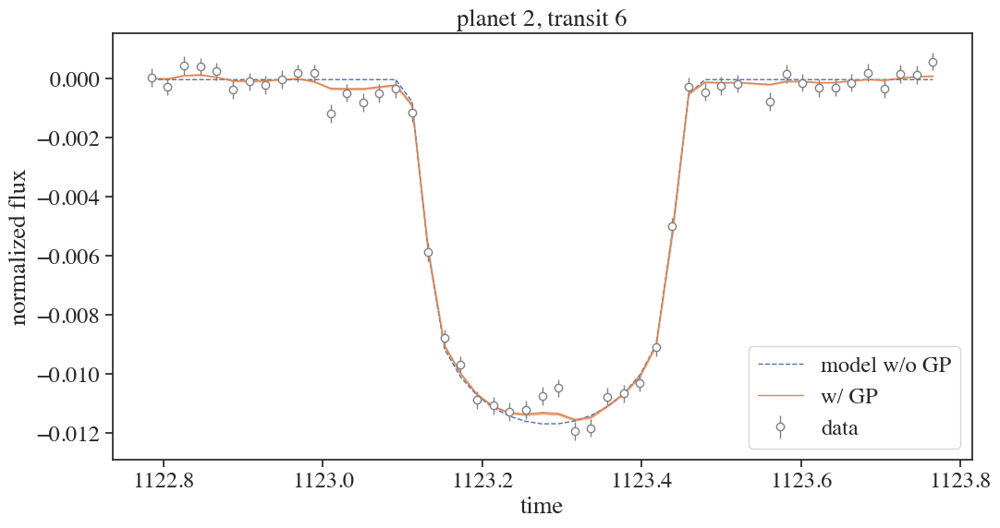

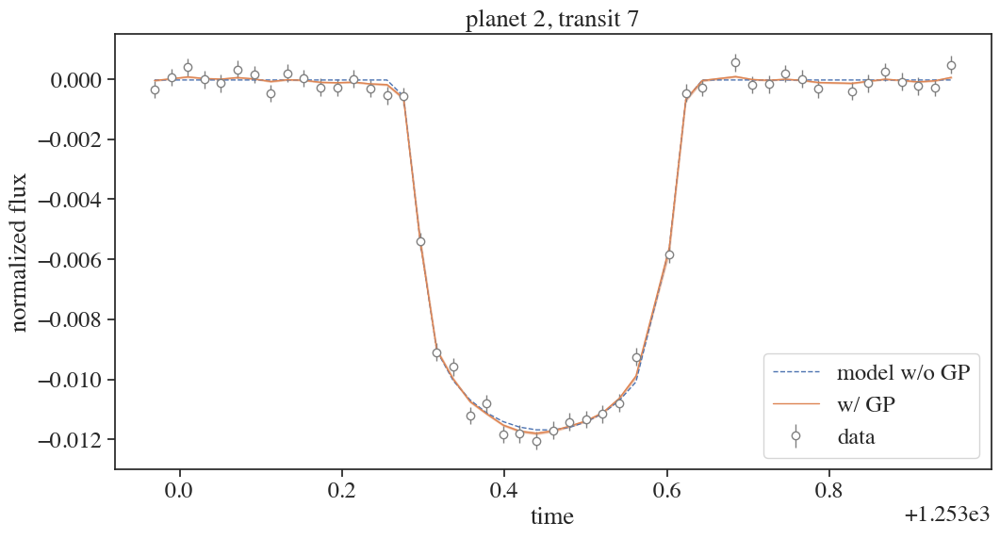

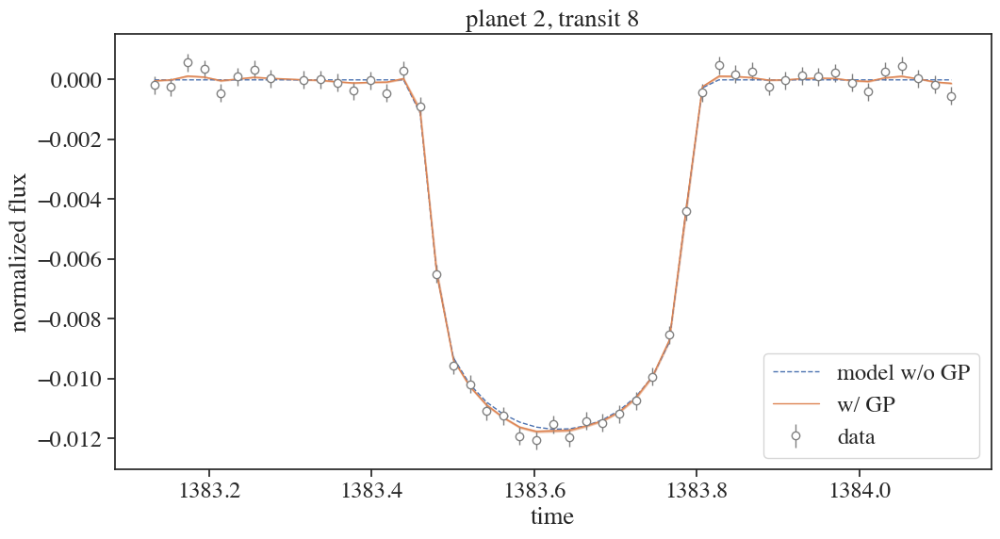

In [44]:
for j in range(3):
    tcs = nt.tcobs[j]
    for k,tc in enumerate(tcs):
        idx = np.abs(time_obs - tc) < 0.5
        plt.figure()
        plt.xlabel("time")
        plt.ylabel("normalized flux")
        plt.title("planet %d, transit %d"%(j,k))
        plt.errorbar(time_obs[idx], flux_obs[idx], yerr=error_obs[idx], fmt='o', lw=1, mfc='white', color='gray', label='data')
        idx = np.abs(time_obs - tc) < 0.5
        plt.plot(time_obs[idx], mu_phys[idx], '--', lw=1, color='C0', label='model w/o GP')
        plt.plot(time_obs[idx], mu[idx], '-', lw=1, color='C1', label='w/ GP')
        plt.fill_between(time_obs[idx], (mu-sigma)[idx], (mu+sigma)[idx], alpha=0.4, color='C1')
        plt.legend(loc='lower right')